----
### COMPILE PREDICTION RESULTS
----

In [ ]:
from export_catalog import *

### the whole loop may take a couple of hours, can be broken down parallel
for year in range(2010,2024):

### i/o configuration
    old_version = "1.1.1"
    new_version = "1.1.1"
    old_filename_suffix = f"_{year}"
    new_filename_subfix = f"_{year}"
    datalist_dir = "/Users/junsu/Documents/data_gcmt.pkl"
    event_filter = ""
    result_csv_filenames = glob.glob(f"./updeANMO_shift5_pred_catalog_*{year}/*_outputs/X_prediction_results.csv")

    old_catalog_dir = f"./globocat_{old_version}{old_filename_suffix}.xml"
    new_catalog_dir = f"./globocat_{new_version}{new_filename_subfix}.xml"
    if not os.path.exists(old_catalog_dir):
        print("A new catalog will be created:", new_catalog_dir)
        globocat = GlobalCatalog()
    else:
        start_time = time.time()
        print('Loading catalog:', old_catalog_dir, end="\r")
        globocat = GlobalCatalog()
        globocat.events = read_events(old_catalog_dir).events
        load_time = time.time() - start_time
        print(f"\nCatalog is loaded in {load_time:.1f} seconds.")


### update catalog and save as new file
    globocat.resource_id=str(f"quakeml:jun.su/globocat_{new_version}")
    globocat.creation_info=CreationInfo(author="Jun Su", version=new_version, creation_time=UTCDateTime.now())

    with open(datalist_dir, 'rb') as f: datalist = pickle.load(f)
    globocat.update_catalog(datalist, result_csv_filenames, new_version)
    print('Saving file...', end="\r")
    globocat.write(new_catalog_dir, format='QUAKEML')
    print("Catalog is saved:", new_catalog_dir)
    
### export pandas dataframe
    df = globocat.get_dataframe(load_station_dict="station_dict.json", include_id=True)
    df.to_pickle(f'updeANMO_shift5_catalog_{year}_plot.pkl')

In [2]:
from export_catalog import *
old_version = "1.1.1"
new_version = "1.1.1"
old_filename_suffix = "_2020"
new_filename_subfix = "_2020"
datalist_dir = "/Users/junsu/Documents/data_gcmt.pkl"
event_filter = ""
result_csv_filenames = glob.glob("./updeANMO_shift5_pred_catalog_*2020/*_outputs/X_prediction_results.csv")

old_catalog_dir = f"./globocat_{old_version}{old_filename_suffix}.xml"
new_catalog_dir = f"./globocat_{new_version}{new_filename_subfix}.xml"
if not os.path.exists(old_catalog_dir):
    print("A new catalog will be created:", new_catalog_dir)
    globocat = GlobalCatalog()
else:
    start_time = time.time()
    print('Loading catalog:', old_catalog_dir, end="\r")
    globocat = GlobalCatalog()
    globocat.events = read_events(old_catalog_dir).events
    load_time = time.time() - start_time
    print(f"\nCatalog is loaded in {load_time:.1f} seconds.")

Loading catalog: ./globocat_1.1.1_2020.xml
Catalog is loaded in 160.5 seconds.


In [2]:
globocat.resource_id=str(f"quakeml:jun.su/globocat_{new_version}")
globocat.creation_info=CreationInfo(author="Jun Su", version=new_version, creation_time=UTCDateTime.now())

with open(datalist_dir, 'rb') as f: datalist = pickle.load(f)
globocat.update_catalog(datalist, result_csv_filenames, new_version)
print('Saving file...', end="\r")
globocat.write(new_catalog_dir, format='QUAKEML')
print("Catalog is saved:", new_catalog_dir)

Progress: [1289/1289] [100.0%] [====================>]
Catalog is updated for 1289 result files.
Catalog is saved: ./globocat_1.1.1_2020.xml


----
### DATA VISUALIZATION
###### GEOGRAPHICAL DISTRIBUTION
----

In [ ]:
## deprecated
import json
from GeoPoint import *
from picker import flatten_list
from export_catalog import get_station_dict

with open('station_dict.json', 'r') as f:
station_dict = json.load(f)

def get_dataframe(cat, include_id=False):
    return pd.DataFrame([flatten_list([
                        arrival.resource_id.id.split('-')[-3].split('_')[:2],
                        arrival.phase,
                        round(arrival.time_residual, 2),
                        arrival.pick_id.get_referred_object().time_errors.confidence_level,
                        round(arrival.distance, 4),
                        round(arrival.azimuth, 2),
                        round(arrival.pick_id.get_referred_object().backazimuth, 2),
                        list(midpoint(GeoPoint(
                                lat = ev.preferred_origin().latitude,
                                lon = ev.preferred_origin().longitude
                            ), GeoPoint(
                                lat = station_dict[f"{'.'.join(arrival.resource_id.id.split('-')[-3].split('_')[:2])}"]['latitude'],
                                lon = station_dict[f"{'.'.join(arrival.resource_id.id.split('-')[-3].split('_')[:2])}"]['longitude']
                            )).get_latlon('deg', precision=3)
                        ),
                        arrival.resource_id.id.split('/')[-1] if include_id else []
                    ]) for ev in cat for arrival in ev.preferred_origin().arrivals ],
                # columns=['network', 'station', 'phase', 'time_residual', 'probability','distance', 'azimuth', 'backazimuth', 'midpoint_lat', 'midpoint_lon', 'arrival_id'],
                columns=['network', 'station', 'phase', 'anomaly', 'probability','gcarc', 'azimuth', 'backazimuth', 'turning_lat', 'turning_lon', 'arrival_id'][:(None if include_id else -1)],
                )
df = get_dataframe(globocat, include_id=False)
df
# df.to_pickle(f'updeANMO_shift5_catalog_2020_plot.pkl')

In [11]:
import glob
import pandas as pd
df = pd.concat([pd.read_pickle(filename) for filename in glob.glob(f'updeANMO_shift5_catalog_*_plot.pkl')], ignore_index=True)

count    1.171029e+06
mean    -3.539167e-01
std      3.607083e+00
min     -1.999000e+01
25%     -2.090000e+00
50%     -2.600000e-01
75%      1.450000e+00
max      1.999000e+01
Name: anomaly, dtype: float64
count    1.422673e+06
mean     9.188929e-01
std      5.624314e+00
min     -2.999000e+01
25%     -2.240000e+00
50%      1.000000e+00
75%      4.210000e+00
max      2.998000e+01
Name: anomaly, dtype: float64


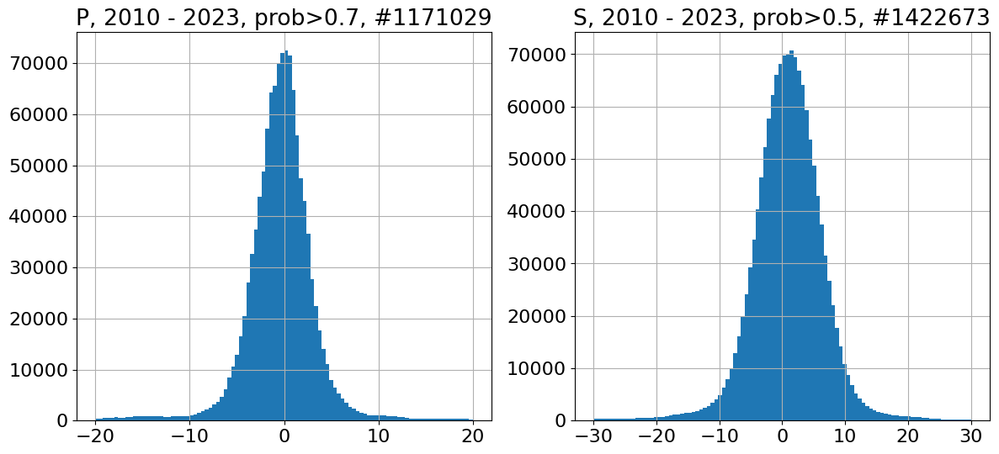

In [12]:
import matplotlib.pyplot as plt
p_thres = 0.7
s_thres = 0.5

plt.figure(figsize=(14,6))
plt.subplot(121)
# for i in range(5,6,1):
    # p_thres = i/10
df_filtered = df.loc[(abs(df['anomaly'])<20) & (df['phase']=='P') & (df['probability']>p_thres) & (df['gcarc']>0)]['anomaly']
df_filtered.hist(bins=100, alpha=1)
# plt.ylim([0,5000])
plt.title(f"P, 2010 - 2023, prob>{p_thres}, #{len(df_filtered)}")
print(df_filtered.describe())
plt.subplot(122)
# for i in range(3,4,1):
#     s_thres = i/10
df_filtered = df.loc[(abs(df['anomaly'])<30) & (df['phase']=='S') & (df['probability']>s_thres) & (df['gcarc']>0)]['anomaly']
df_filtered.hist(bins=100, alpha=1)
# plt.ylim([0,5000])
plt.title(f"S, 2010 - 2023, prob>{s_thres}, #{len(df_filtered)}")
print(df_filtered.describe())

In [14]:
df[:3]

,network,station,phase,anomaly,probability,gcarc,azimuth,backazimuth,turning_lat,turning_lon,arrival_id
0,ZH,SM48,P,46.18,0.19,86.7144,337.43,154.59,3.842,-89.449,evct-2010-09-09T07:28:05.600Z-ZH_SM48_LH-P-PREM
1,ZH,SM48,S,-5.64,0.51,86.7144,337.43,154.59,3.842,-89.449,evct-2010-09-09T07:28:05.600Z-ZH_SM48_LH-S-PREM
2,LD,MMNY,P,-2.99,0.92,79.7476,357.19,176.96,2.732,-75.958,evct-2010-09-09T07:28:05.600Z-LD_MMNY_LH-P-PREM


In [ ]:
import matplotlib.pyplot as plt
from export_catalog import plot_depthslice
    
p_thres = 0.7
s_thres = 0.5
gcarc_interval = 5

for top_gcarc in range(50, 70, 5):
    plt.figure(figsize=(24,8))
    plt.rcParams["font.size"] = 16

    plt.subplot(121)
    plot_depthslice(phase = 'p',
                    value = 'anomaly',
                    gcarc_range = (top_gcarc,top_gcarc+gcarc_interval),
                    fidelity_func = lambda p: p-p_thres,
                    value_constraint = lambda x: abs(x)<15,
                    raw_filename = 'updeANMO_shift5_catalog_*_plot.pkl',
                    average_ray=True,
                    demean=True,
                    plot_legend=True
                    )
    plt.subplot(122)
    plot_depthslice(phase = 's',
                    value = 'anomaly',
                    gcarc_range = (top_gcarc,top_gcarc+gcarc_interval),
                    fidelity_func = lambda p: p-s_thres,
                    value_constraint = lambda x: abs(x)<30,
                    raw_filename = 'updeANMO_shift5_catalog_*_plot.pkl',
                    average_ray=True,
                    demean=True,
                    )
    plt.subplots_adjust(wspace=0.1)
    plt.savefig(f"qc_rayavg.{top_gcarc}-{top_gcarc+gcarc_interval}.png", bbox_inches="tight")
# plt.show()

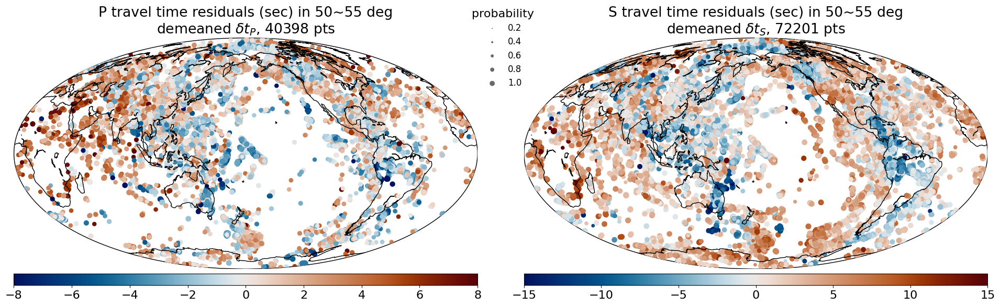

In [23]:
from IPython.display import Image
top_gcarc = 50
gcarc_interval = 5
Image(f"qc_rayavg.{top_gcarc}-{top_gcarc+gcarc_interval}.png")


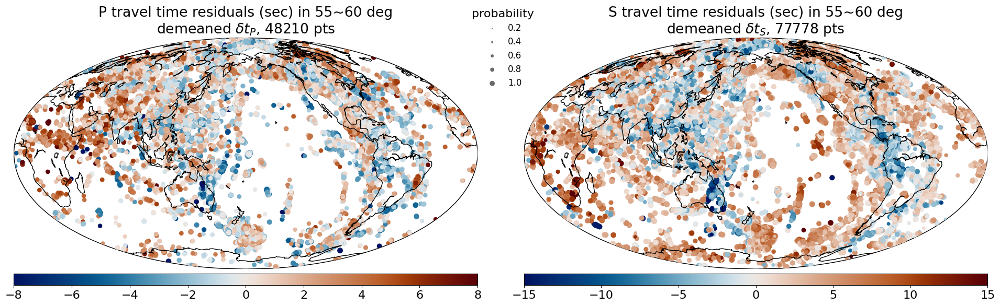

In [24]:
top_gcarc = 55
Image(f"qc_rayavg.{top_gcarc}-{top_gcarc+gcarc_interval}.png")

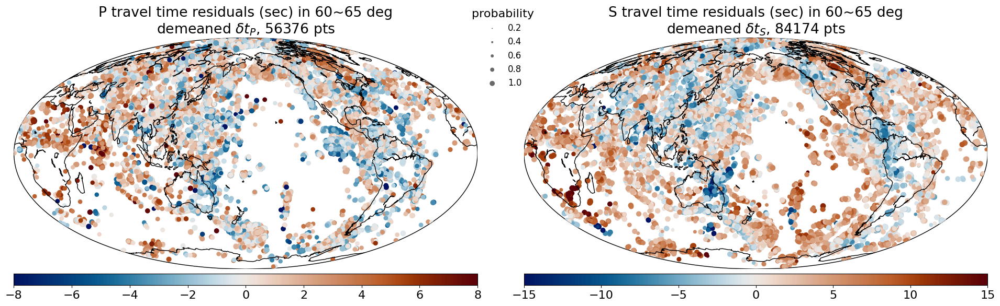

In [25]:
top_gcarc = 60
Image(f"qc_rayavg.{top_gcarc}-{top_gcarc+gcarc_interval}.png")

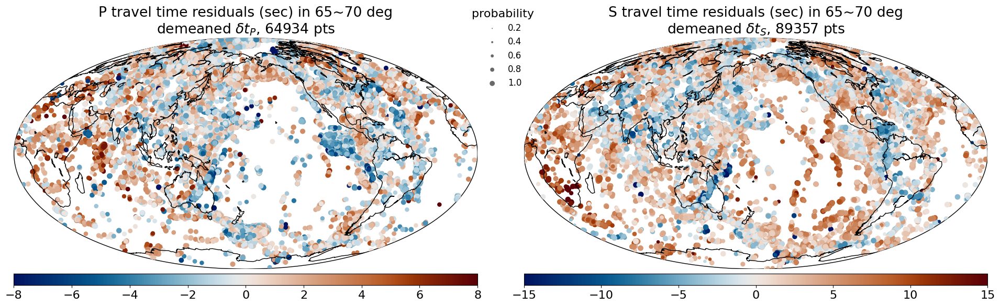

In [26]:
top_gcarc = 65
Image(f"qc_rayavg.{top_gcarc}-{top_gcarc+gcarc_interval}.png")

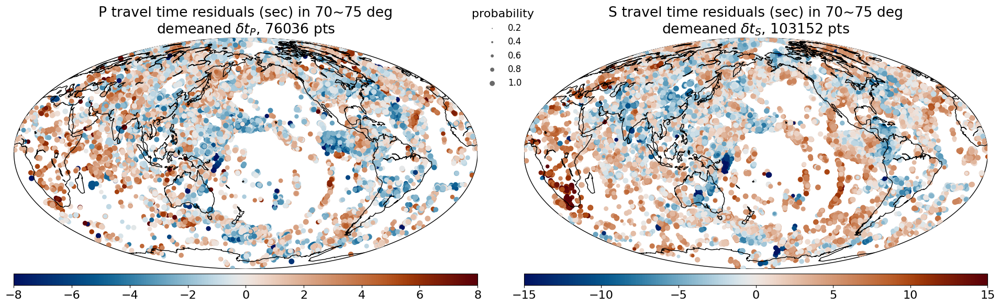

In [27]:
top_gcarc = 70
Image(f"qc_rayavg.{top_gcarc}-{top_gcarc+gcarc_interval}.png")

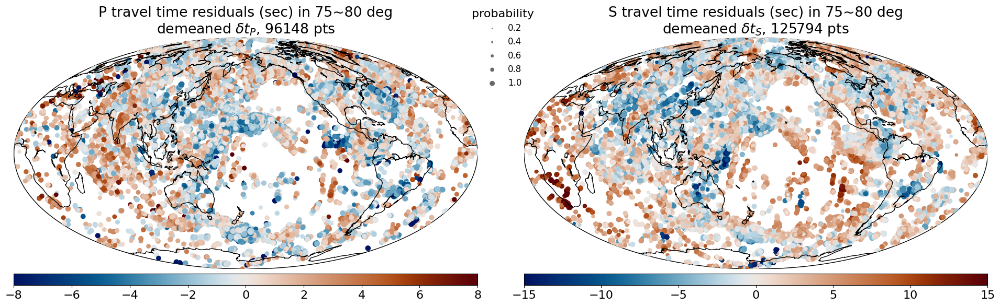

In [28]:
top_gcarc = 75
Image(f"qc_rayavg.{top_gcarc}-{top_gcarc+gcarc_interval}.png")

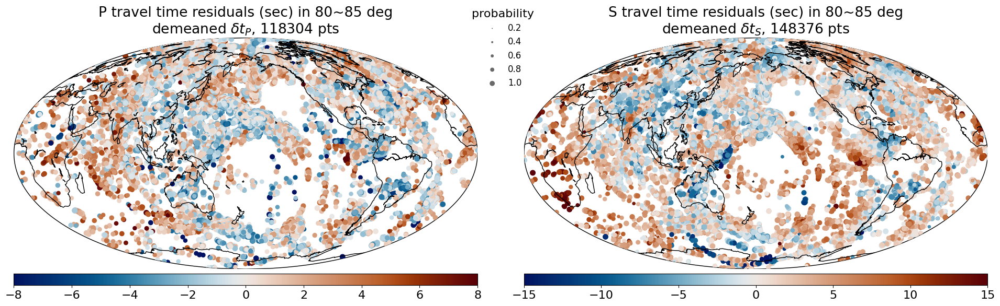

In [29]:
top_gcarc = 80
Image(f"qc_rayavg.{top_gcarc}-{top_gcarc+gcarc_interval}.png")

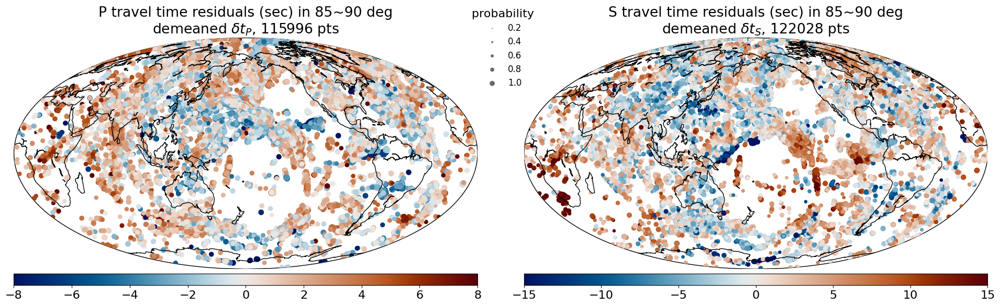

In [30]:
top_gcarc = 85
Image(f"qc_rayavg.{top_gcarc}-{top_gcarc+gcarc_interval}.png")

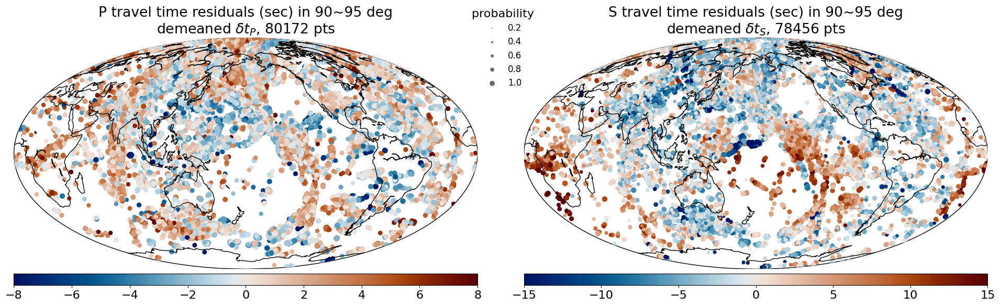

In [31]:
top_gcarc = 90
Image(f"qc_rayavg.{top_gcarc}-{top_gcarc+gcarc_interval}.png")

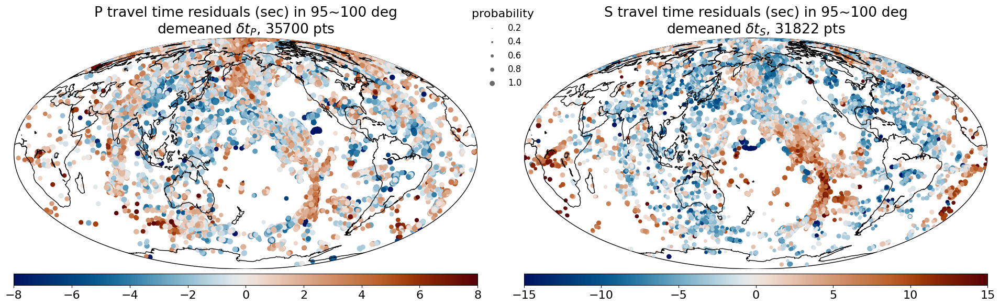

In [32]:
top_gcarc = 95
Image(f"qc_rayavg.{top_gcarc}-{top_gcarc+gcarc_interval}.png")

----
### DATA VISUALIZATION
###### SLOPE ANALYSIS
----

In [3]:
from export_catalog import plot_depthslice, plot_vpvs_ratio
p_thres = 0.7
s_thres = 0.5

get_p_table = lambda gcarc_range: plot_depthslice(phase = 'p',
                    value = 'anomaly',
                    gcarc_range = gcarc_range,
                    fidelity_func = lambda p: p-p_thres,
                    value_constraint = lambda x: abs(x)<20,
                    raw_filename = 'updeANMO_shift5_catalog_*_plot.pkl',
                    average_ray=False,
                    demean=True,
                    plot=False
                )
get_s_table = lambda gcarc_range: plot_depthslice(phase = 's',
                    value = 'anomaly',
                    gcarc_range = gcarc_range,
                    fidelity_func = lambda p: p-s_thres,
                    value_constraint = lambda x: abs(x)<30,
                    raw_filename = 'updeANMO_shift5_catalog_*_plot.pkl',
                    average_ray=False,
                    demean=True,
                    plot=False
                )

47276 points fit the conditions
79715 points fit the conditions
56312 points fit the conditions
85177 points fit the conditions
67088 points fit the conditions
92740 points fit the conditions
77180 points fit the conditions
98717 points fit the conditions
90068 points fit the conditions
113681 points fit the conditions
114105 points fit the conditions
139676 points fit the conditions
141698 points fit the conditions
169889 points fit the conditions
137753 points fit the conditions
140893 points fit the conditions


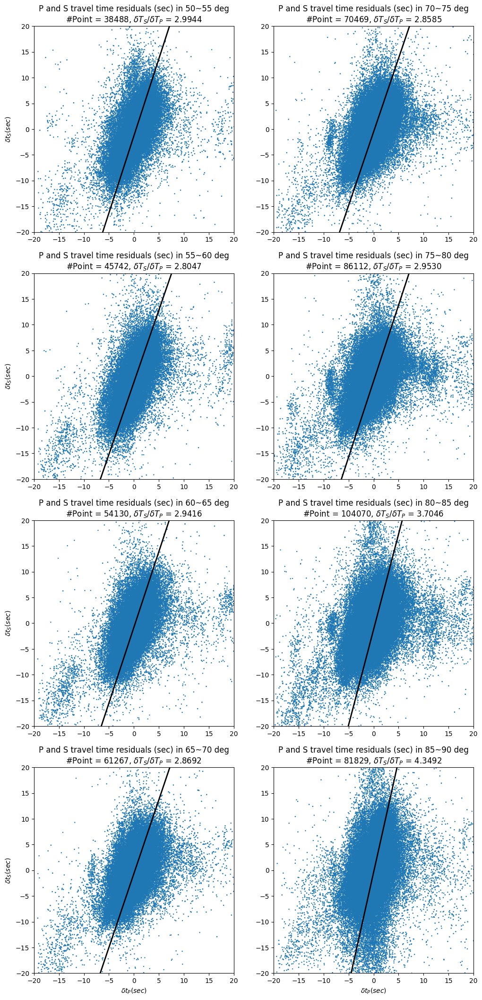

In [6]:
import matplotlib.pyplot as plt

# plt.cla(); plt.clf()
plt.figure(figsize=(12,26))
plt.subplot(421); plot_vpvs_ratio(get_p_table, get_s_table, (50, 55), plot_ylabel=True)
plt.subplot(423); plot_vpvs_ratio(get_p_table, get_s_table, (55, 60), plot_ylabel=True)
plt.subplot(425); plot_vpvs_ratio(get_p_table, get_s_table, (60, 65), plot_ylabel=True)
plt.subplot(427); plot_vpvs_ratio(get_p_table, get_s_table, (65, 70), plot_ylabel=True,plot_xlabel=True)
plt.subplot(422); plot_vpvs_ratio(get_p_table, get_s_table, (70, 75))
plt.subplot(424); plot_vpvs_ratio(get_p_table, get_s_table, (75, 80))
plt.subplot(426); plot_vpvs_ratio(get_p_table, get_s_table, (80, 85))
plt.subplot(428); plot_vpvs_ratio(get_p_table, get_s_table, (85, 90), plot_xlabel=True)
plt.subplots_adjust(hspace=0.2)
plt.show()

----
### DEV
----

In [19]:
old_version = "1.0-b.3"
new_version = "1.0-b.3"
datalist_dir = "/Users/junsu/Documents/data_gcmt.pkl"
event_filter =  ""
filename_subfix = ""
result_csv_filenames = glob.glob("./updeANMO_shift5_pred_catalog_*/*_outputs/X_prediction_results.csv")

if not os.path.exists(f"./globocat_{old_version}.xml"):
    globocat = Catalog()
else:
    globocat = read_events(f"./globocat_{old_version}.xml")

globocat.resource_id=str(f"quakeml:jun.su/globocat_{new_version}")
globocat.creation_info=CreationInfo(author="Jun Su", version=new_version, creation_time=UTCDateTime.now())

with open(datalist_dir, 'rb') as f: datalist = pickle.load(f)
df = update_dataframe(globocat, datalist, result_csv_filenames, new_version)

'Progress: [2225/2225] [100.0%] [====================>]'

In [21]:
df.to_pickle(f"./globocat_{new_version}.pkl")